In [ ]:
  !pip3 install http://download.pytorch.org/whl/cu80/torch-0.3.1-cp36-cp36m-linux_x86_64.whl 
  !pip3 install torchvision
  !pip3 install --no-cache-dir -I pillow

ERROR: torch-0.3.1-cp36-cp36m-linux_x86_64.whl is not a supported wheel on this platform.
     |████████████████████████████████| 2.2MB 12.1MB/s 
ERROR: albumentations 0.1.12 has requirement imgaug<0.2.7,>=0.2.5, but you'll have imgaug 0.2.9 which is incompatible.


In [ ]:
import torch
import torch.nn
from torch.autograd.gradcheck import zero_gradients
import torch.nn.functional as F
import torchvision.models as models
from PIL import Image
from torchvision import transforms
import numpy as np
import requests, io
import matplotlib.pyplot as plt
from torch.autograd import Variable
%matplotlib inline

import time
from torch import linalg as LA

#### SET UP MODELS

In [ ]:
resnet18 = models.resnet18(pretrained=True)
resnet18 = resnet18.eval()

Downloading: "https://download.pytorch.org/models/resnet18-5c106cde.pth" to /root/.cache/torch/hub/checkpoints/resnet18-5c106cde.pth


In [ ]:
mobilenet = models.mobilenet_v2(pretrained=True)
mobilenet = mobilenet.eval()

Downloading: "https://download.pytorch.org/models/mobilenet_v2-b0353104.pth" to /root/.cache/torch/hub/checkpoints/mobilenet_v2-b0353104.pth


In [ ]:
vgg = models.vgg19(pretrained=True)
vgg = vgg.eval()

Downloading: "https://download.pytorch.org/models/vgg19-dcbb9e9d.pth" to /root/.cache/torch/hub/checkpoints/vgg19-dcbb9e9d.pth


In [ ]:
alexnet = models.alexnet(pretrained=True)
alexnet = alexnet.eval()

Downloading: "https://download.pytorch.org/models/alexnet-owt-4df8aa71.pth" to /root/.cache/torch/hub/checkpoints/alexnet-owt-4df8aa71.pth


#### INPUT AND SETUP IMAGES

In [ ]:
#make image into tensor
def setup_image(image):

  #define function for resizing image
  preprocess = transforms.Compose([
                transforms.Resize((150,150)), #150,150 yields best results
                transforms.ToTensor(),
                transforms.Normalize(mean=[0.485, 0.456, 0.406], 
                                     std=[0.229, 0.224, 0.225])
                ])
  
  tensor = preprocess(image)
  tensor = tensor.unsqueeze(0)

  return tensor

In [ ]:
url = "https://upload.wikimedia.org/wikipedia/commons/thumb/b/b0/Bengal_tiger_%28Panthera_tigris_tigris%29_female_3_crop.jpg/1200px-Bengal_tiger_%28Panthera_tigris_tigris%29_female_3_crop.jpg"  #tiger pic
response = requests.get(url)
img1 = Image.open(io.BytesIO(response.content))

In [ ]:

url = "https://st.depositphotos.com/1000172/1797/i/950/depositphotos_17970881-stock-photo-rooster-on-white-background.jpg"  #rooster pic
response = requests.get(url)
img2 = Image.open(io.BytesIO(response.content))

In [ ]:

url = "https://upload.wikimedia.org/wikipedia/commons/7/73/Lion_waiting_in_Namibia.jpg"  # lion pic
response = requests.get(url)
img3 = Image.open(io.BytesIO(response.content))

In [ ]:

url = "https://upload.wikimedia.org/wikipedia/commons/thumb/c/c5/Leopard_africa.jpg/1280px-Leopard_africa.jpg"  #leopard pic
response = requests.get(url)
img4 = Image.open(io.BytesIO(response.content))

In [ ]:
url = "https://upload.wikimedia.org/wikipedia/commons/thumb/6/63/African_elephant_warning_raised_trunk.jpg/2560px-African_elephant_warning_raised_trunk.jpg"  #elephant pic
response = requests.get(url)
img5 = Image.open(io.BytesIO(response.content))

In [ ]:
url = "https://upload.wikimedia.org/wikipedia/commons/7/74/Grevy%27s_Zebra_Stallion.jpg"  #zebra pic
response = requests.get(url)
img6 = Image.open(io.BytesIO(response.content))

In [ ]:
url = "https://s3.amazonaws.com/cdn-origin-etr.akc.org/wp-content/uploads/2017/11/12234026/Dalmatian-On-White-01.jpg"  #dalmantian pic
response = requests.get(url)
img7 = Image.open(io.BytesIO(response.content))

In [ ]:
url = "https://www.marlerblog.com/files/2013/03/orange.jpg"  #orange pic
response = requests.get(url)
img8 = Image.open(io.BytesIO(response.content))

In [ ]:
url = "https://images-na.ssl-images-amazon.com/images/I/71%2BqAJehpkL._SL1500_.jpg"  #pineapple pic
response = requests.get(url)
img9 = Image.open(io.BytesIO(response.content))

In [ ]:
url = "https://media.istockphoto.com/photos/female-pig-isolated-on-white-background-picture-id1143332810?k=6&m=1143332810&s=170667a&w=0&h=xvrh3cLVOkx4k2Jo_j_W5WuSndgz6c4JPMEjFSl-4Rg="  #pig pic
response = requests.get(url)
img10 = Image.open(io.BytesIO(response.content))

In [ ]:
image_tensor1 = setup_image(img1) #preprocess an i

image_tensor2 = setup_image(img2) #preprocess an i

image_tensor3 = setup_image(img3) #preprocess an i

image_tensor4 = setup_image(img4) #preprocess an i

image_tensor5 = setup_image(img5) #preprocess an i

image_tensor6 = setup_image(img6) #preprocess an i

image_tensor7 = setup_image(img7) #preprocess an i

image_tensor8 = setup_image(img8) #preprocess an i

image_tensor9 = setup_image(img9) #preprocess an i

image_tensor10 = setup_image(img10) #preprocess an i

#### SET LABELS FROM JSON

In [ ]:
#create labels with their designated index
labels_link = "https://savan77.github.io/blog/labels.json"    
labels_json = requests.get(labels_link).json()

labels1 = {}

for index, label in labels_json.items():
  idx = int(index)
  labels1[idx] = label


#### FUNCTIONS: TENSOR TO ARRAY & GRADIENT SETUP & ATTACK

In [ ]:
# undo preprocess transform of tensor
# makes more accurate results if we include this step
def make_array(tensor):
  tensor = tensor.squeeze() #remove dim

  #undo preprocess function
  undo_preprocess = transforms.Compose([
                          transforms.Normalize(mean=[0,0,0], 
                                     std=[1/0.229, 1/0.224, 1/0.225]),#undo std
                          transforms.Normalize(mean=[-0.485, -0.456, -0.406], 
                                     std=[1,1,1])# undo mean
                      ])
  
  arr = undo_preprocess(tensor)
  arr = arr.permute(1,2,0).detach().numpy() #permute the array into less dim

  return arr

In [ ]:
#compute gradient and returns the sign
def compute_grad(func, input, **kwargs):

  input.requires_grad = True #assume that compute grad as supposed to tensor

  loss = func(input, **kwargs)
  loss.backward() #compute grad

  input.requires_grad= False #undo assumption

  return input.grad.data


In [ ]:
def func(input, net=None, target=None):

  #net = torch module, the class network
  #target = ground truth label

  out = net(input)
  #run forward path, then compute loss
  loss = torch.nn.functional.nll_loss(out, target=torch.LongTensor([target]))
  #print(f"loss: {loss.item()}")
  return loss

In [ ]:
def orig_prob(tensor, net):
  img_variable = Variable(tensor, requires_grad=True)

  output = net.forward(img_variable)
  prediction = torch.argmax(output.data, 1)[0] 

  pred_name = labels1[prediction.item()]

  output_prob = F.softmax(output, dim=1)
  
  pred_prob= torch.max(output_prob.data,1)[0]

  return pred_prob.item()

In [ ]:
#set variables, works for all imgs
iteration = 100
eps = 0.03


In [ ]:
#run FGSM
def attack(tensor, net, eps, iteration):
  # net: pretrained class network

  #clone tensor, so not modifiying original
  new_tensor = tensor.detach().clone()
  #the old prediciton
  old_prediction = net(tensor).argmax()
  old_prob = orig_prob(tensor, net)

  y_true = old_prediction.item()
  #print(f"Original prediction: {old_prediction.item()}")

  for i in range(iteration):
    #net.zero_grad() #set all grad to 0

    img_variable = Variable(new_tensor, requires_grad=True) #convert tensor into a variabl
    grad = compute_grad(func, img_variable.data, net=net, target= y_true)

    x_grad = torch.sign(grad)

    x_adversarial = img_variable.data + eps*x_grad

    new_tensor = torch.clamp(x_adversarial, -2,2)#min:-2, max:2; to make sure image stays realistic
    new_prediction = net(new_tensor).argmax()

    #x_grad = grad.sign()
    output = net.forward(Variable(x_adversarial))
    x_adv_pred = labels1[torch.argmax(output.data, 1)[0].item()]
    x_adv_prob = F.softmax(output, dim=1)
    adv_pred_prob = torch.max(x_adv_prob.data,1)[0].item()

    #print(adv_pred_prob)
    #print(old_prediction.item())
    #print(new_prediction.item())
    if old_prediction.item() != new_prediction.item():
      break

  return new_tensor, old_prediction.item(), new_prediction.item(), x_grad, old_prob, adv_pred_prob


#### SET UP P NORM AVERAGE

In [ ]:
resnet_p=[None]*10

mobilenet_p=[None]*10

alexnet_p=[None]*10

vgg_p=[None]*10

#### SET UP TIME

In [ ]:
resnet_t=[None]*10

mobilenet_t=[None]*10

alexnet_t=[None]*10

vgg_t=[None]*10

#### FGSM ATTACK: COMPILES ATTACK AND CALCULATES THE P-NORM (2, SINGLE LARGEST VALUE)

In [ ]:
def run_attack(net, img_tensor):


  new_tensor, old_prediction, new_prediction, x_grad, old_prob, new_prob = attack(
      img_tensor, net, eps, iteration)

  figure, ax = plt.subplots(1,4, figsize=(18,8))

  arr = make_array(img_tensor)
  new_arr = make_array(new_tensor)
  diff_arr = np.abs(arr- new_arr).mean(axis=-1) #for p
  diff_arr = diff_arr/diff_arr.max() #input for p

  grad_arr = make_array(x_grad)


  #print(f"new_arr= {new_arr}")
  #print(new_prob)

  ax[0].imshow((arr* 255).astype(np.uint8))
  ax[2].imshow((new_arr* 255).astype(np.uint8))
  ax[1].imshow((grad_arr* 255).astype(np.uint8))
  ax[3].imshow((diff_arr* 255).astype(np.uint8), cmap="gray")

  ax[0].axis("off")
  ax[1].axis("off")
  ax[2].axis("off")
  ax[3].axis("off")

  ax[0].set_title(f"Clean Image: {old_prediction}")
  
  ax[1].set_title(f"+0.03* Perturbation")
  
  ax[2].set_title(f"=Adversarial: {new_prediction}")
  
  ax[3].set_title(f",Difference=Clean-Adversarial")

  ax[0].text(0.5,-0.13, "Prediction: {}\n Probability: {}".format(labels1[old_prediction], (old_prob*100)),
             size=10, ha="center", transform=ax[0].transAxes)
  
  ax[2].text(0.5,-0.13, "Prediction: {}\n Probability: {}".format(labels1[new_prediction], (new_prob*100)),
             size=10, ha="center", transform=ax[2].transAxes)


  plt.savefig("chart.png")

  dist_tensor = torch.cdist(img_tensor, new_tensor, p=2) #find distance between img_tensor and new_tensor

  dist = torch.reshape(dist_tensor, (-1,)) #make dist_tensor into 1-D

  #print(dist)

  longest_p = LA.norm(dist, 2) #p norm of 2, the single largest value

  return longest_p
  
  #print(old_prob)

#### IMG1


Total Time for Attack2 1.596 seconds.


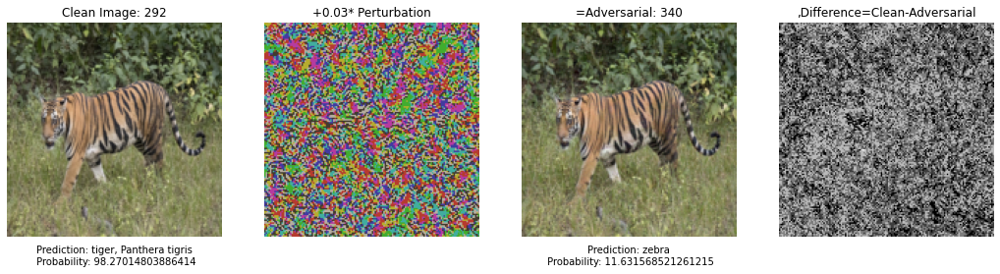

In [ ]:
#resnet18
start = time.perf_counter()

resnet_p[0]=run_attack(resnet18, image_tensor1)

total_time = time.perf_counter()-start

resnet_t[0] = total_time

print('Total Time for Attack2 %.3f seconds.' %total_time)

#print(resnet_p[0])

Total Time for Attack2 5.723 seconds.


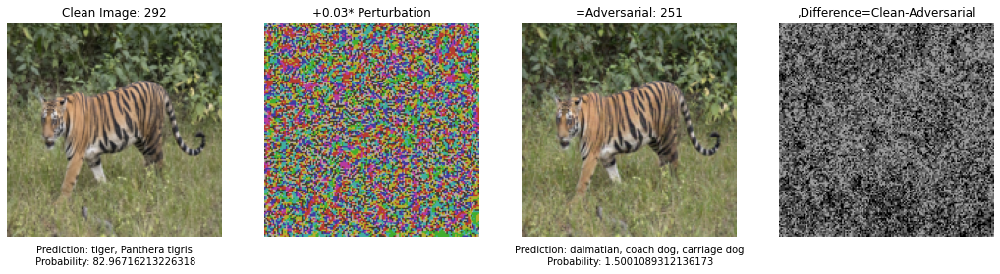

In [ ]:
#vgg-19
start = time.perf_counter()

vgg_p[0] = run_attack(vgg, image_tensor1)
total_time = time.perf_counter()-start
vgg_t[0] = total_time
print('Total Time for Attack2 %.3f seconds.' %total_time)


Total Time for Attack2 0.717 seconds.


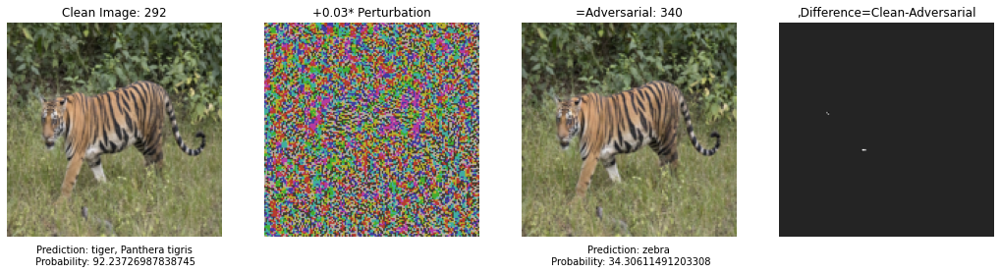

In [ ]:
#mobilenet
start = time.perf_counter()
mobilenet_p[0]=run_attack(mobilenet, image_tensor1)
total_time = time.perf_counter()-start
mobilenet_t[0] = total_time
print('Total Time for Attack2 %.3f seconds.' %total_time)


Total Time for Attack2 0.681 seconds.


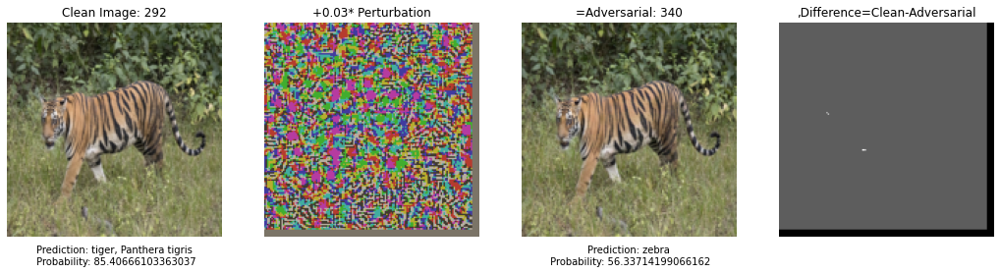

In [ ]:
#alexnet
start = time.perf_counter()
alexnet_p[0]=run_attack(alexnet, image_tensor1)
total_time = time.perf_counter()-start
alexnet_t[0] = total_time
print('Total Time for Attack2 %.3f seconds.' %total_time)


#### IMG2

Total Time for Attack2 1.403 seconds.


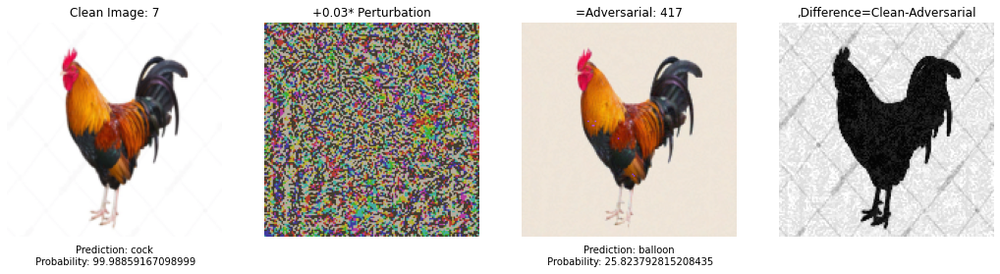

In [ ]:
#resnet18
start = time.perf_counter()
resnet_p[1] = run_attack(resnet18, image_tensor2)

total_time = time.perf_counter()-start
resnet_t[1]= total_time

print('Total Time for Attack2 %.3f seconds.' %total_time)

Total Time for Attack2 9.705 seconds.


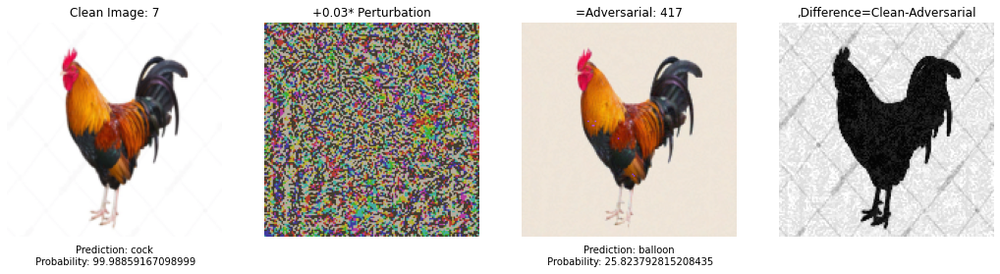

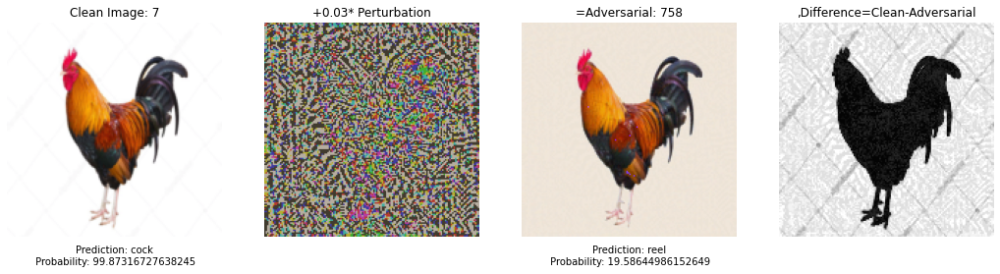

In [ ]:
#vgg-19
start = time.perf_counter()
vgg_p[1] = run_attack(resnet18, image_tensor2)
run_attack(vgg, image_tensor2)
 
total_time = time.perf_counter()-start
vgg_t[1] =total_time
print('Total Time for Attack2 %.3f seconds.' %total_time)

Total Time for Attack2 0.942 seconds.


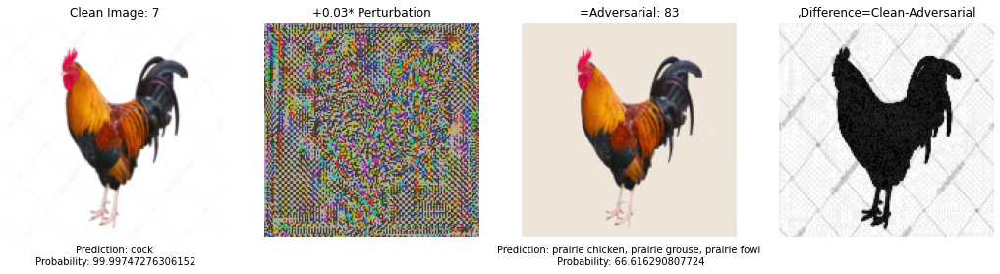

In [ ]:
#mobilenet
start = time.perf_counter()
mobilenet_p[1] = run_attack(mobilenet, image_tensor2)
total_time = time.perf_counter()-start
mobilenet_t[1] = total_time
print('Total Time for Attack2 %.3f seconds.' %total_time)

Total Time for Attack2 0.982 seconds.


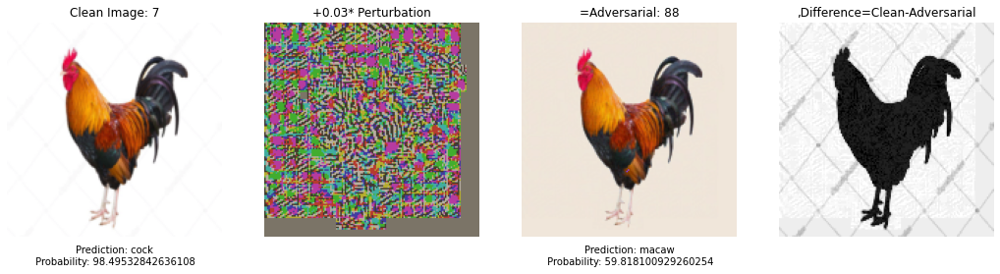

In [ ]:
#alexnet
start = time.perf_counter()
alexnet_p[1] =run_attack(alexnet, image_tensor2)
total_time = time.perf_counter()-start
alexnet_t[1]=total_time
print('Total Time for Attack2 %.3f seconds.' %total_time)

#### IMG3

Total Time for Attack2 0.793 seconds.


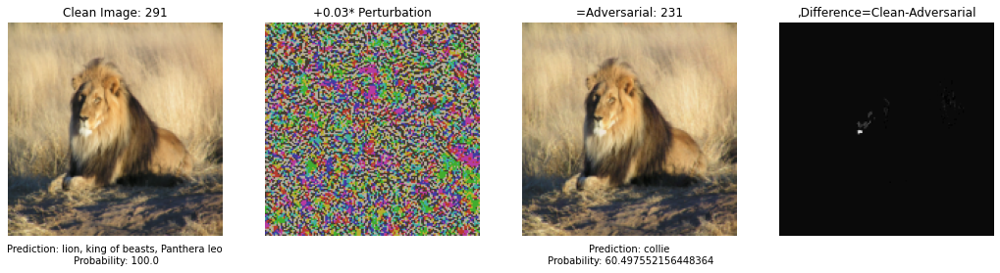

In [ ]:
#resnet18
start = time.perf_counter()
resnet_p[2]=run_attack(resnet18, image_tensor3)

total_time = time.perf_counter()-start
resnet_t[2] = total_time
print('Total Time for Attack2 %.3f seconds.' %total_time)

Total Time for Attack2 3.356 seconds.


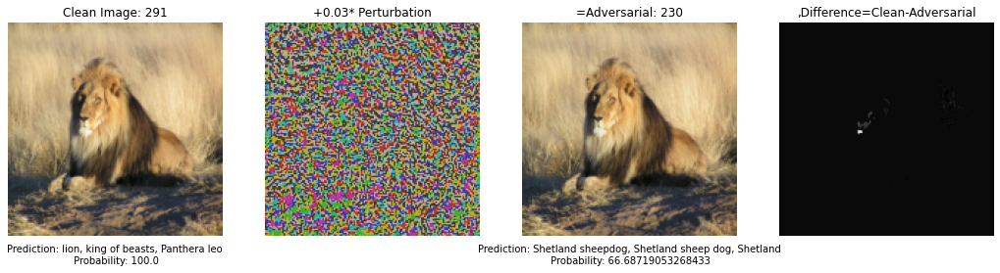

In [ ]:
#vgg-19
start = time.perf_counter()
vgg_p[2] =run_attack(vgg, image_tensor3)
total_time = time.perf_counter()-start
vgg_t[2]=total_time
print('Total Time for Attack2 %.3f seconds.' %total_time)

Total Time for Attack2 0.675 seconds.


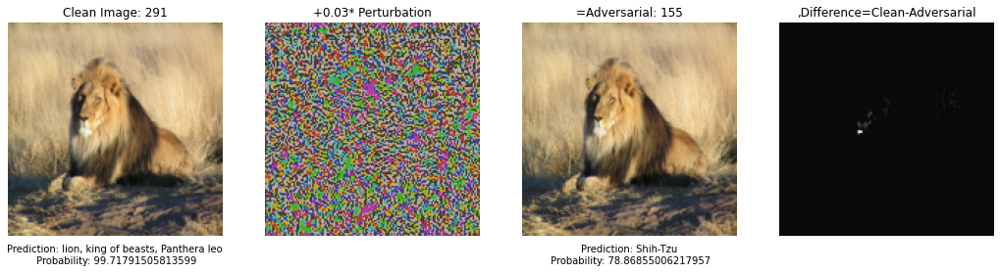

In [ ]:
#mobilenet
start = time.perf_counter()
mobilenet_p[2]=run_attack(mobilenet, image_tensor3)
total_time = time.perf_counter()-start
mobilenet_t[2] = total_time
print('Total Time for Attack2 %.3f seconds.' %total_time)

Total Time for Attack2 0.849 seconds.


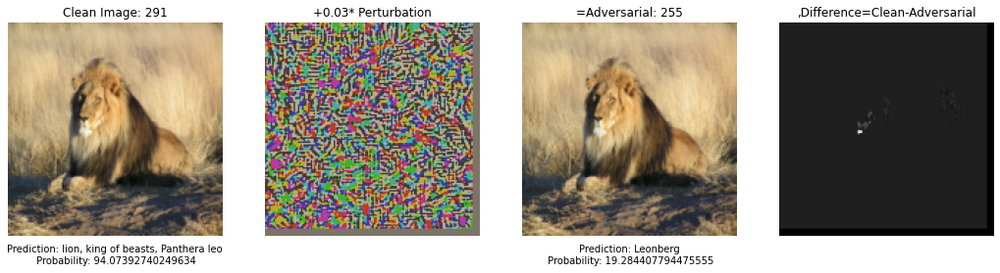

In [ ]:
#alexnet
start = time.perf_counter()
alexnet_p[2]=run_attack(alexnet, image_tensor3)
total_time = time.perf_counter()-start
alexnet_t[2] = total_time
print('Total Time for Attack2 %.3f seconds.' %total_time)

#### IMG4

Total Time for Attack2 1.143 seconds.


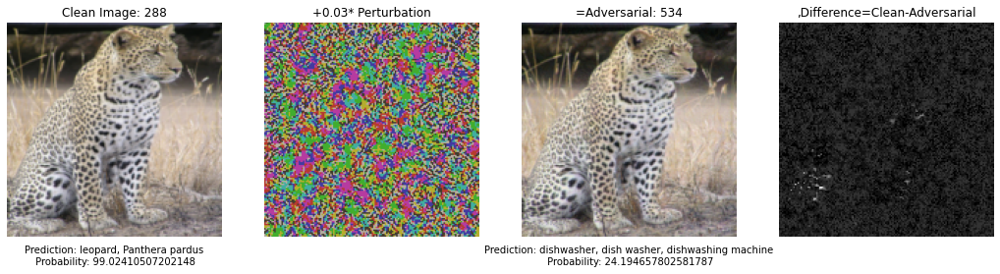

In [ ]:
#resnet18
start = time.perf_counter()
resnet_p[3] = run_attack(resnet18, image_tensor4)

total_time = time.perf_counter()-start
resnet_t[3]= total_time
print('Total Time for Attack2 %.3f seconds.' %total_time)

Total Time for Attack2 3.320 seconds.


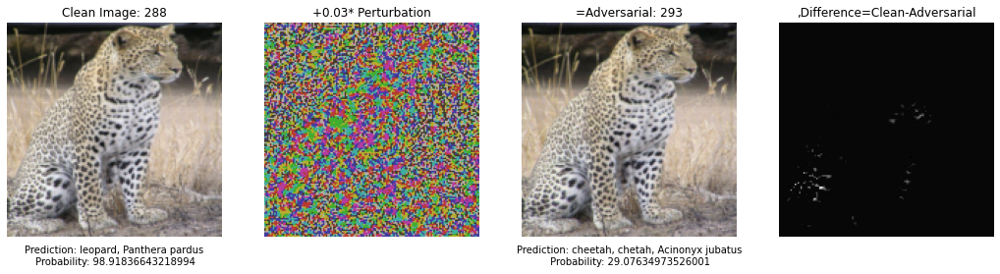

In [ ]:
#vgg-19
start = time.perf_counter()
vgg_p[3] =run_attack(vgg, image_tensor4)
total_time = time.perf_counter()-start
vgg_t[3] = total_time
print('Total Time for Attack2 %.3f seconds.' %total_time)

Total Time for Attack2 0.706 seconds.


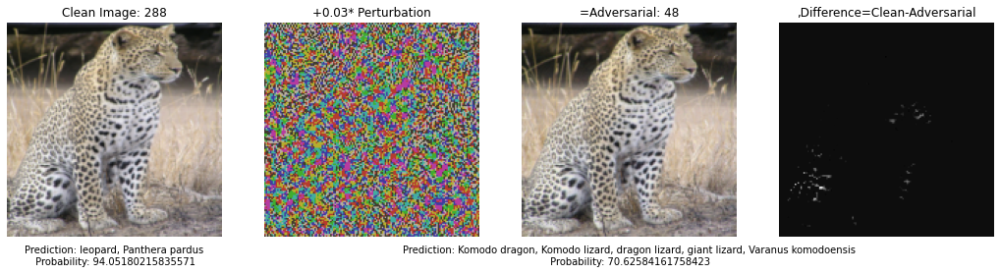

In [ ]:
#mobilenet
start = time.perf_counter()
mobilenet_p[3]=run_attack(mobilenet, image_tensor4)
total_time = time.perf_counter()-start
mobilenet_t[3] = total_time
print('Total Time for Attack2 %.3f seconds.' %total_time)

Total Time for Attack2 0.734 seconds.


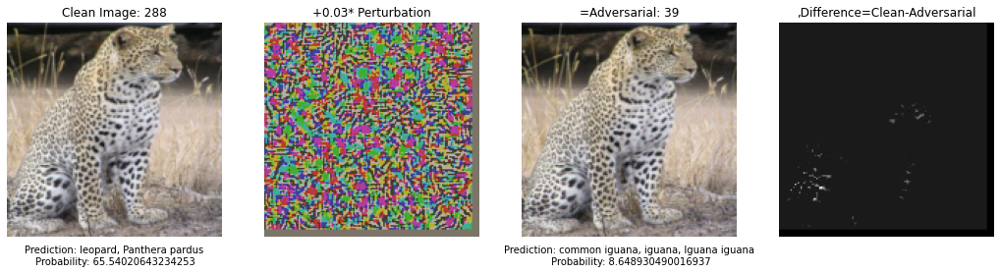

In [ ]:
#alexnet
start = time.perf_counter()
alexnet_p[3]=run_attack(alexnet, image_tensor4)
total_time = time.perf_counter()-start
alexnet_t[3] = total_time
print('Total Time for Attack2 %.3f seconds.' %total_time)

#### IMG5

Total Time for Attack2 0.835 seconds.


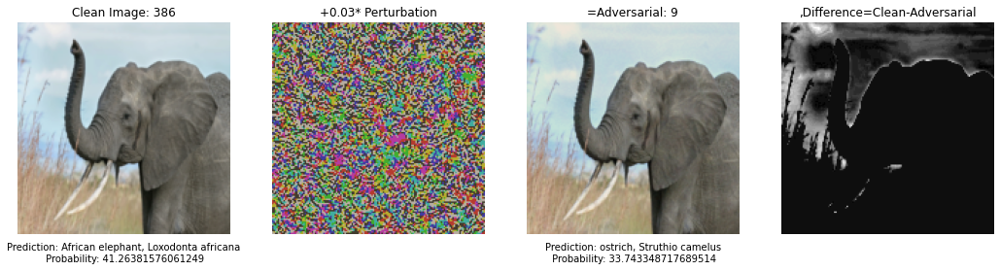

In [ ]:
#resnet18
start = time.perf_counter()
resnet_p[4] = run_attack(resnet18, image_tensor5)

total_time = time.perf_counter()-start
resnet_t[4]=total_time
print('Total Time for Attack2 %.3f seconds.' %total_time)

Total Time for Attack2 3.328 seconds.


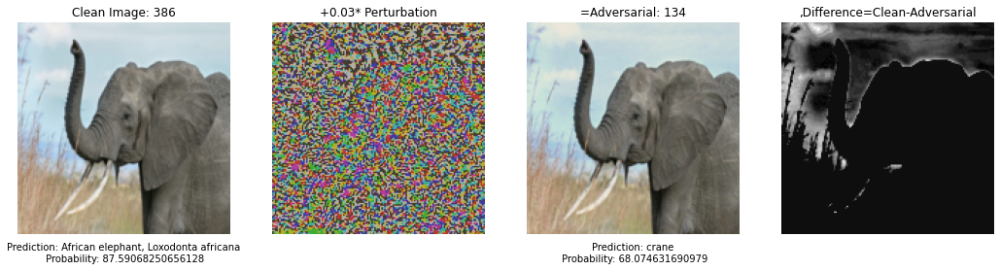

In [ ]:
#vgg-19
start = time.perf_counter()
vgg_p[4]=run_attack(vgg, image_tensor5)
total_time = time.perf_counter()-start
vgg_t[4]=total_time
print('Total Time for Attack2 %.3f seconds.' %total_time)

Total Time for Attack2 0.700 seconds.


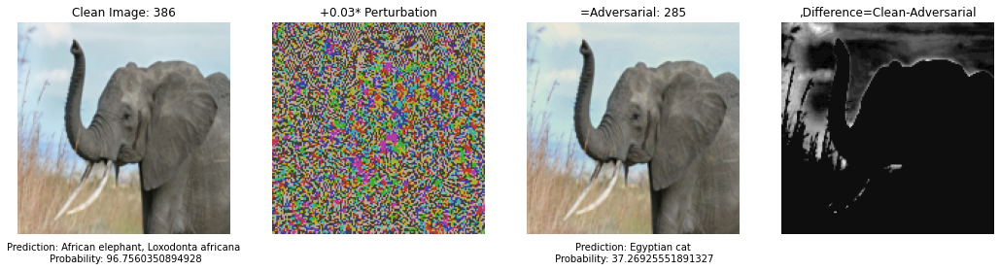

In [ ]:
#mobilenet
start = time.perf_counter()
mobilenet_p[4]=run_attack(mobilenet, image_tensor5)
total_time = time.perf_counter()-start
mobilenet_t[4]=total_time
print('Total Time for Attack2 %.3f seconds.' %total_time)

Total Time for Attack2 0.730 seconds.


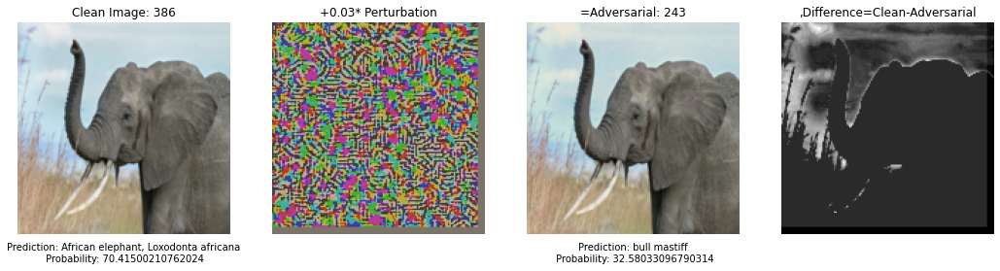

In [ ]:
#alexnet
start = time.perf_counter()
alexnet_p[4]=run_attack(alexnet, image_tensor5)
total_time = time.perf_counter()-start
alexnet_t[4]= total_time
print('Total Time for Attack2 %.3f seconds.' %total_time)

#### IMG6

Total Time for Attack2 1.195 seconds.


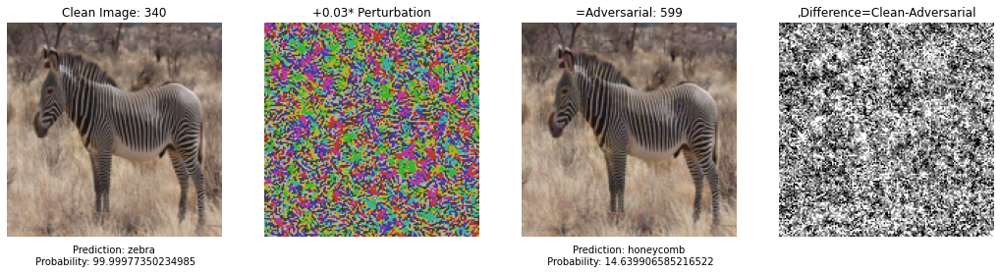

In [ ]:
#resnet18
start = time.perf_counter()
resnet_p[5]=run_attack(resnet18, image_tensor6)

total_time = time.perf_counter()-start
resnet_t[5]=total_time
print('Total Time for Attack2 %.3f seconds.' %total_time)

Total Time for Attack2 3.401 seconds.


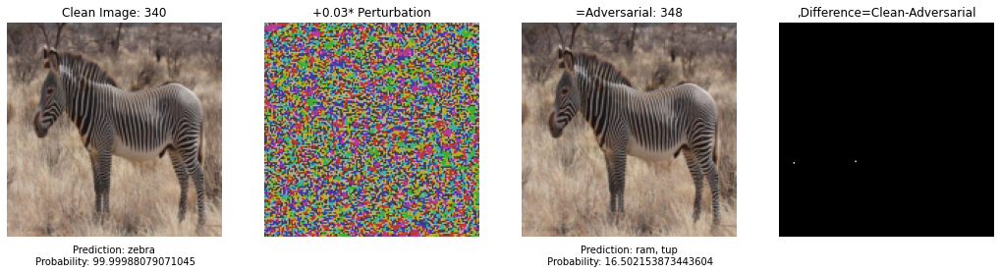

In [ ]:
#vgg-19
start = time.perf_counter()
vgg_p[5]=run_attack(vgg, image_tensor6)
total_time = time.perf_counter()-start
vgg_t[5]= total_time
print('Total Time for Attack2 %.3f seconds.' %total_time)

Total Time for Attack2 1.239 seconds.


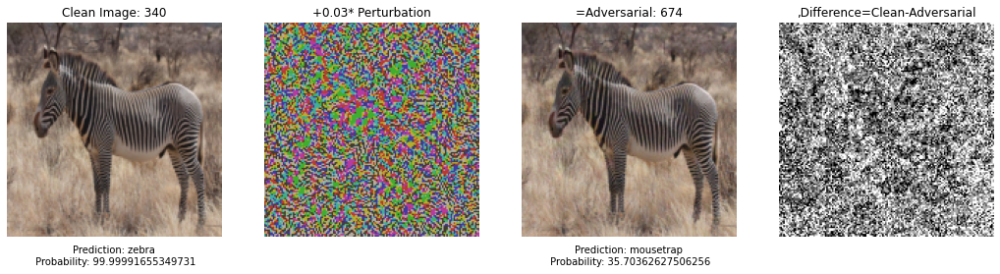

In [ ]:
#mobilenet
start = time.perf_counter()
mobilenet_p[5]=run_attack(mobilenet, image_tensor6)
total_time = time.perf_counter()-start
mobilenet_t[5]=total_time
print('Total Time for Attack2 %.3f seconds.' %total_time)

Total Time for Attack2 0.772 seconds.


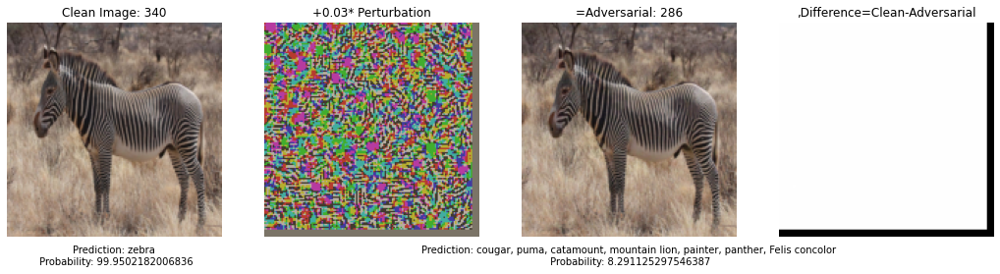

In [ ]:
#alexnet
start = time.perf_counter()
alexnet_p[5]= run_attack(alexnet, image_tensor6)
total_time = time.perf_counter()-start
alexnet_t[5]= total_time
print('Total Time for Attack2 %.3f seconds.' %total_time)

#### IMG7

Total Time for Attack2 1.100 seconds.


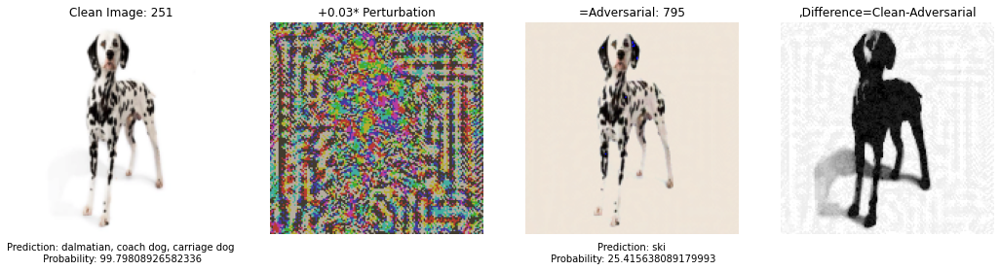

In [ ]:
#resnet18
start = time.perf_counter()
resnet_p[6]=run_attack(resnet18, image_tensor7)

total_time = time.perf_counter()-start
resnet_t[6]= total_time
print('Total Time for Attack2 %.3f seconds.' %total_time)

Total Time for Attack2 5.529 seconds.


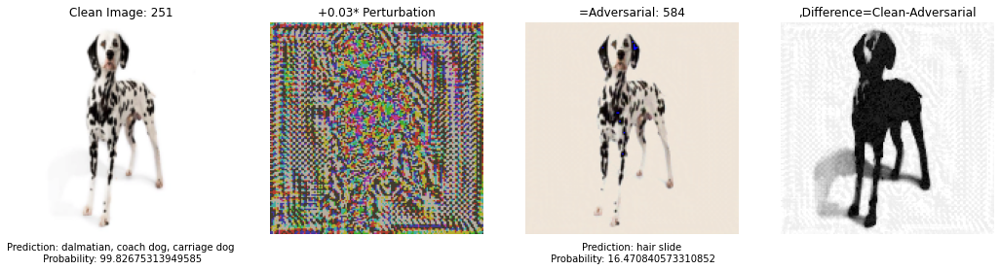

In [ ]:
#vgg-19
start = time.perf_counter()
vgg_p[6]=run_attack(vgg, image_tensor7)
total_time = time.perf_counter()-start
vgg_t[6]= total_time
print('Total Time for Attack2 %.3f seconds.' %total_time)

Total Time for Attack2 0.878 seconds.


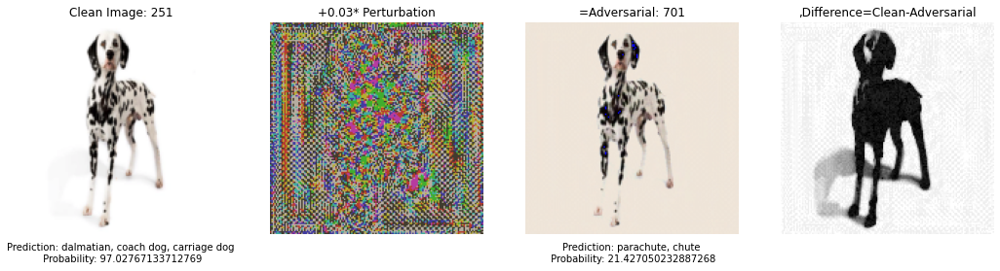

In [ ]:
#mobilenet
start = time.perf_counter()
mobilenet_p[6]=run_attack(mobilenet, image_tensor7)
total_time = time.perf_counter()-start
mobilenet_t[6]=total_time
print('Total Time for Attack2 %.3f seconds.' %total_time)

Total Time for Attack2 0.663 seconds.


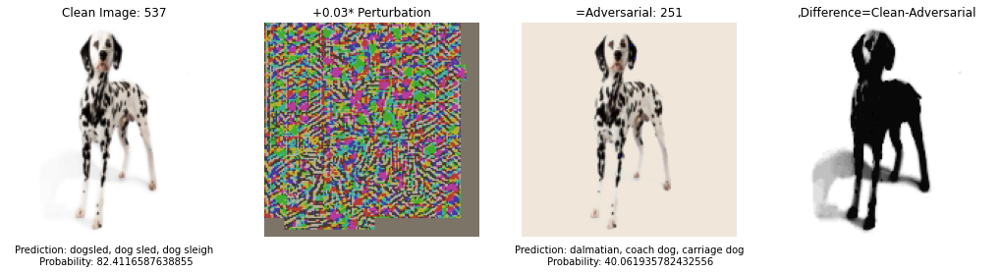

In [ ]:
#alexnet
start = time.perf_counter()
alexnet_p[6]=run_attack(alexnet, image_tensor7)
total_time = time.perf_counter()-start
alexnet_t[6]=total_time
print('Total Time for Attack2 %.3f seconds.' %total_time)

#### IMG8

Total Time for Attack2 1.422 seconds.


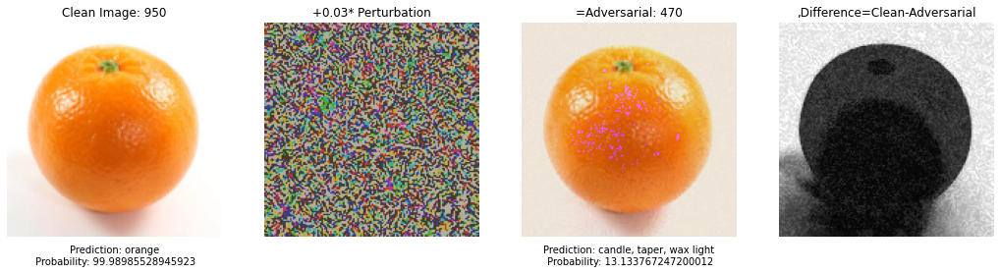

In [ ]:
#resnet18
start = time.perf_counter()
resnet_p[7]=run_attack(resnet18, image_tensor8)

total_time = time.perf_counter()-start
resnet_t[7]=total_time
print('Total Time for Attack2 %.3f seconds.' %total_time)

Total Time for Attack2 3.361 seconds.


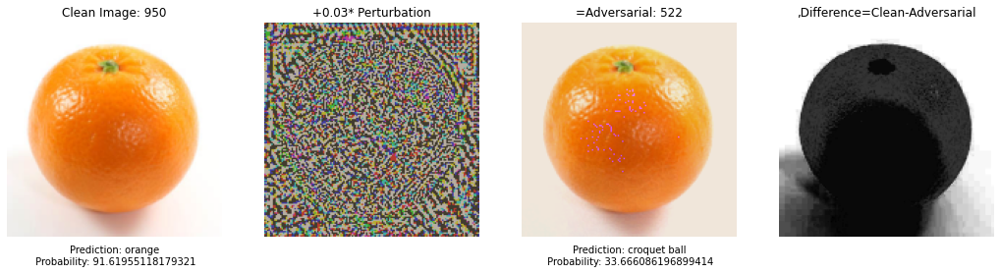

In [ ]:
#vgg-19
start = time.perf_counter()
vgg_p[7]=run_attack(vgg, image_tensor8)
total_time = time.perf_counter()-start
vgg_t[7]=total_time
print('Total Time for Attack2 %.3f seconds.' %total_time)

Total Time for Attack2 0.906 seconds.


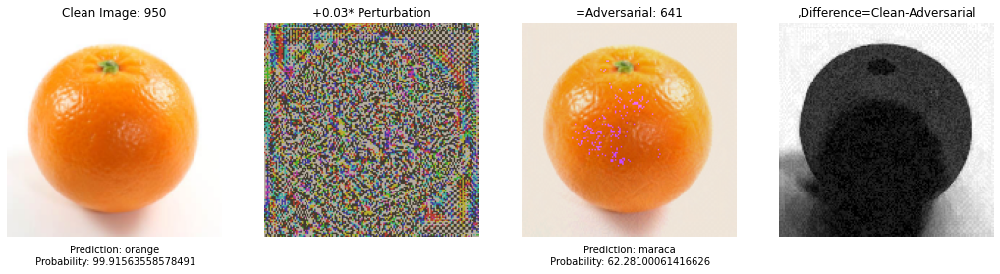

In [ ]:
#mobilenet
start = time.perf_counter()
mobilenet_p[7]=run_attack(mobilenet, image_tensor8)
total_time = time.perf_counter()-start
mobilenet_t[7]=total_time
print('Total Time for Attack2 %.3f seconds.' %total_time)

Total Time for Attack2 1.822 seconds.


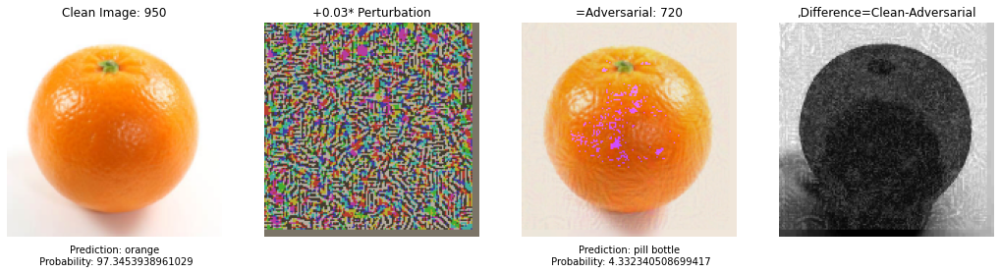

In [ ]:
#alexnet
start = time.perf_counter()
alexnet_p[7]=run_attack(alexnet, image_tensor8)
total_time = time.perf_counter()-start
alexnet_t[7]=total_time
print('Total Time for Attack2 %.3f seconds.' %total_time)

#### IMG9

Total Time for Attack2 1.442 seconds.


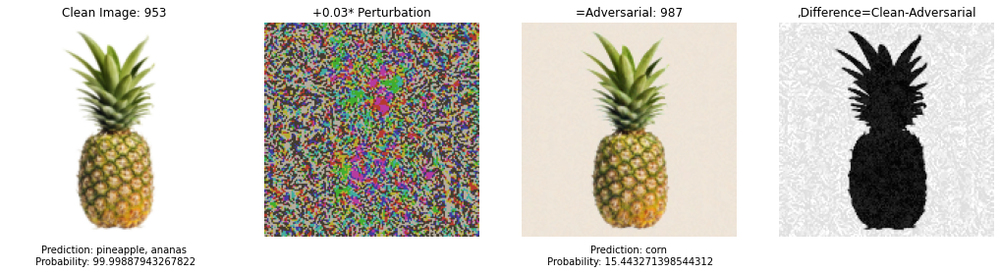

In [ ]:
#resnet18
start = time.perf_counter()
resnet_p[8]=run_attack(resnet18, image_tensor9)

total_time = time.perf_counter()-start
resnet_t[8]=total_time
print('Total Time for Attack2 %.3f seconds.' %total_time)

Total Time for Attack2 5.489 seconds.


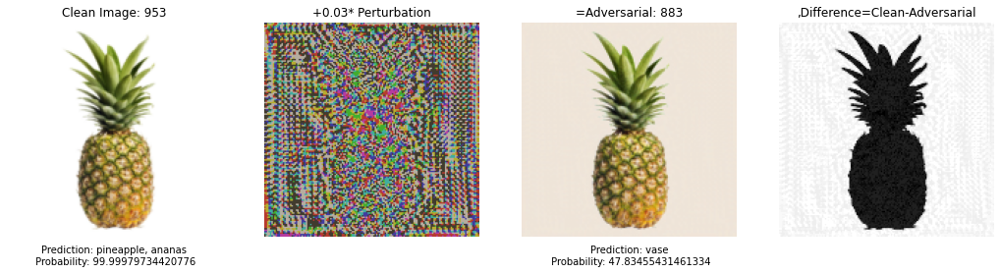

In [ ]:
#vgg-19
start = time.perf_counter()
vgg_p[8]=run_attack(vgg, image_tensor9)
total_time = time.perf_counter()-start
vgg_t[8]= total_time
print('Total Time for Attack2 %.3f seconds.' %total_time)

Total Time for Attack2 1.125 seconds.


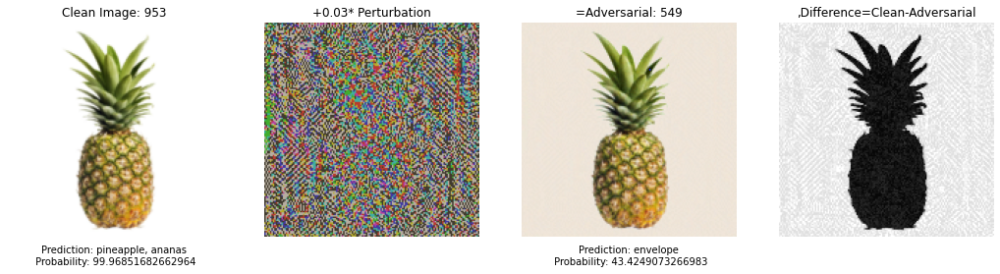

In [ ]:
#mobilenet
start = time.perf_counter()
mobilenet_p[8]=run_attack(mobilenet, image_tensor9)
total_time = time.perf_counter()-start
mobilenet_t[8]=total_time
print('Total Time for Attack2 %.3f seconds.' %total_time)

Total Time for Attack2 1.540 seconds.


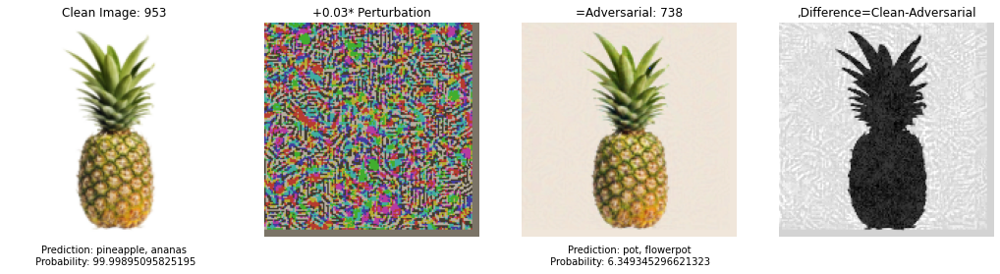

In [ ]:
#alexnet
start = time.perf_counter()
alexnet_p[8]=run_attack(alexnet, image_tensor9)
total_time = time.perf_counter()-start
alexnet_t[8]=total_time
print('Total Time for Attack2 %.3f seconds.' %total_time)

#### IMG10

Total Time for Attack2 0.811 seconds.


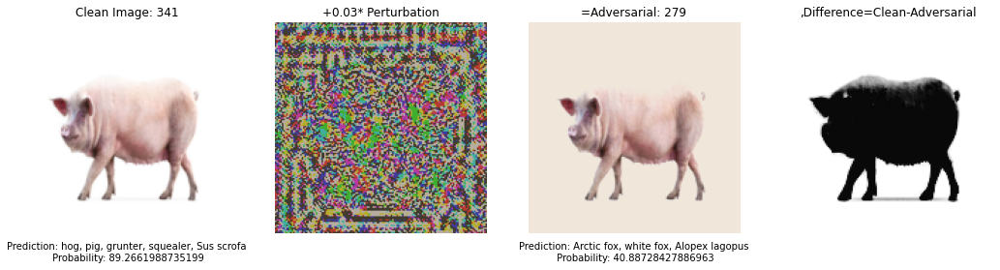

In [ ]:
#resnet18
start = time.perf_counter()
resnet_p[9]=run_attack(resnet18, image_tensor10)

total_time = time.perf_counter()-start
resnet_t[9]=total_time
print('Total Time for Attack2 %.3f seconds.' %total_time)

Total Time for Attack2 3.287 seconds.


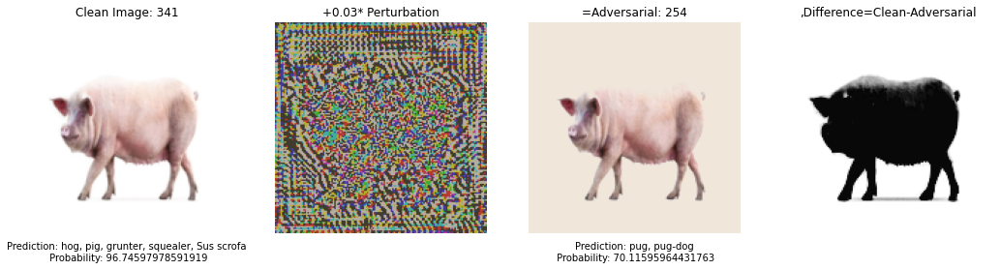

In [ ]:
#vgg-19
start = time.perf_counter()
vgg_p[9]=run_attack(vgg, image_tensor10)
total_time = time.perf_counter()-start
vgg_t[9]=total_time
print('Total Time for Attack2 %.3f seconds.' %total_time)

Total Time for Attack2 0.624 seconds.


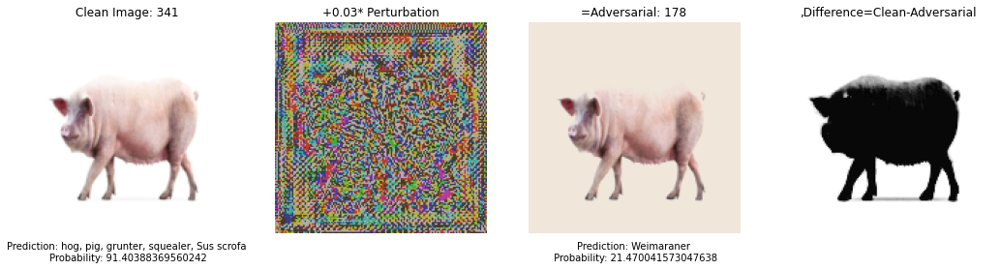

In [ ]:
#mobilenet
start = time.perf_counter()
mobilenet_p[9]=run_attack(mobilenet, image_tensor10)
total_time = time.perf_counter()-start
mobilenet_t[9]=total_time
print('Total Time for Attack2 %.3f seconds.' %total_time)

Total Time for Attack2 0.671 seconds.


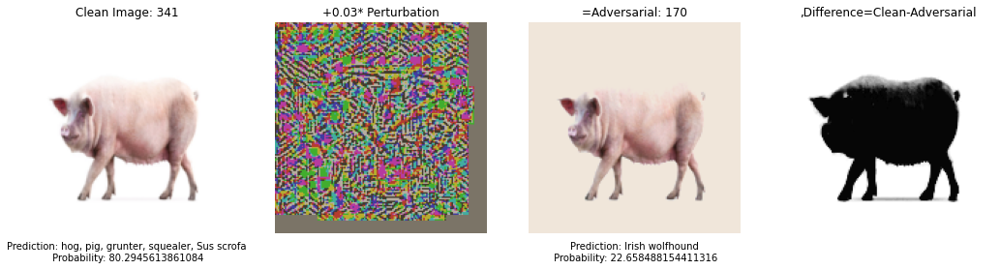

In [ ]:
#alexnet
start = time.perf_counter()
alexnet_p[9]=run_attack(alexnet, image_tensor10)
total_time = time.perf_counter()-start
alexnet_t[9]=total_time
print('Total Time for Attack2 %.3f seconds.' %total_time)

#### FIND AVERAGE P NORM AND TIME FOR 4 MODELS

In [ ]:
def find_average(list):
  total = 0
  for i in range(10):
    total+= list[i]

  total/=10

  return total


In [ ]:
res_p_ave = find_average(resnet_p)
res_t_ave = find_average(resnet_t)

print(f"After 10 images, Resnet-18 has average p norm of {res_p_ave}\n and {res_t_ave} seconds")

After 10 images, Resnet-18 has average p norm of 3548.381591796875
 and 1.1740284370000211 seconds


In [ ]:
vgg_p_ave = find_average(vgg_p)
vgg_t_ave = find_average(vgg_t)

print(f"After 10 images, VGG-19 has average p norm of {vgg_p_ave}\n and {vgg_t_ave} seconds")

After 10 images, VGG-19 has average p norm of 3547.74462890625
 and 4.6498651965000395 seconds


In [ ]:
mobile_p_ave = find_average(mobilenet_p)
mobile_t_ave = find_average(mobilenet_t)

print(f"After 10 images, MobileNet has average p norm of {mobile_p_ave}\n and {mobile_t_ave} seconds")

After 10 images, MobileNet has average p norm of 3548.407470703125
 and 0.8513960637999901 seconds


In [ ]:
alex_p_ave = find_average(alexnet_p)
alex_t_ave = find_average(alexnet_t)

print(f"After 10 images, AlexNet has average p norm of {alex_p_ave}\n and {alex_t_ave} seconds")

After 10 images, AlexNet has average p norm of 3546.92431640625
 and 0.9443781487000109 seconds
